### GROUP 2: CAPSTONE ECOLOGICAL MODELS OF ENCHANTED KINGDOMS PROJECT PYTHON CODES

### GROUP MEMBERS: Thomas Torku, Oluwasakin Ebenezer, Divyashree Koti, Yinusa Ahmeed

#### SYSTEM DYNAMICS MODEL FOR ENCHANTED KINGDOM

SDM Version 1: witches = 6

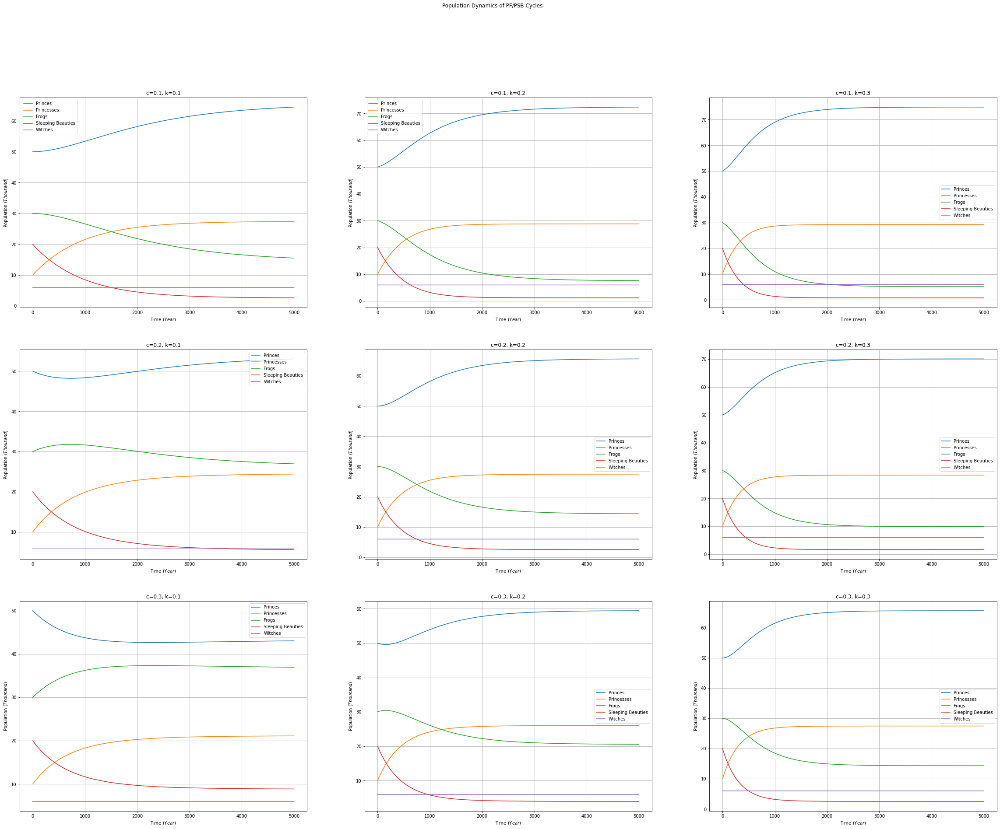

In [ ]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
# Define the system of differential equations
def model(y, t, c_PF, c_PSB, k):
    N_princes, N_princesses, N_frogs, N_sleeping_beauties, N_witches = y
    dN_princes_dt = -c_PF * N_witches * N_princes + k * N_frogs * N_princesses
    dN_princesses_dt = -c_PSB * N_witches * N_princesses + k * N_sleeping_beauties * N_princes
    dN_frogs_dt = c_PF * N_witches * N_princes - k * N_frogs * N_princesses
    dN_sleeping_beauties_dt = c_PSB * N_witches * N_princesses - k * N_sleeping_beauties * N_princes
    dN_witches_dt = 0
    return [dN_princes_dt, dN_princesses_dt, dN_frogs_dt, dN_sleeping_beauties_dt, dN_witches_dt]

def call_model(y0):

  
  # Define figure size and layout
  fig, axs = plt.subplots(len(k_values), len(c_values), figsize=(40, 30))
  # listOf_Xticks = np.arange(0, 5000, 1)

  # Loop through each set of constants and plot the results
  for i, c in enumerate(c_values):
      for j, k in enumerate(k_values):
          # Solve the system of differential equations with the current set of constants
          y = odeint(model, y0, t, args=(c, c, k))
        
          # Plot the results
          ax = axs[i, j]
          ax.plot(t, y[:, 0], label='Princes')
          ax.plot(t, y[:, 1], label='Princesses')
          ax.plot(t, y[:, 2], label='Frogs')
          ax.plot(t, y[:, 3], label='Sleeping Beauties')
          ax.plot(t, y[:, 4], label='Witches')
          ax.set_xticklabels([-1000,0,1000,2000,3000,4000,5000])
          ax.set_title(f'c={c}, k={k}')
          ax.set_xlabel('Time ($Year$)')
          ax.set_ylabel('Population ($Thousand$)')
          ax.legend()

          # Add grid
          ax.grid(True)

  # Add overall figure title
  fig.suptitle('Population Dynamics of PF/PSB Cycles')

  
# Define the initial conditions
y0 = [50, 10, 30, 20, 6]

# Define the time points
t = np.linspace(0, 1, 5001)

# # Define the time points
# t = np.linspace(0, 5000, 101)

# Define the constants to vary
c_values = [0.1, 0.2, 0.3]
k_values = [0.1, 0.2, 0.3]


call_model(y0)

# Show the plots
plt.show()


SDM Version 1: witches = 50

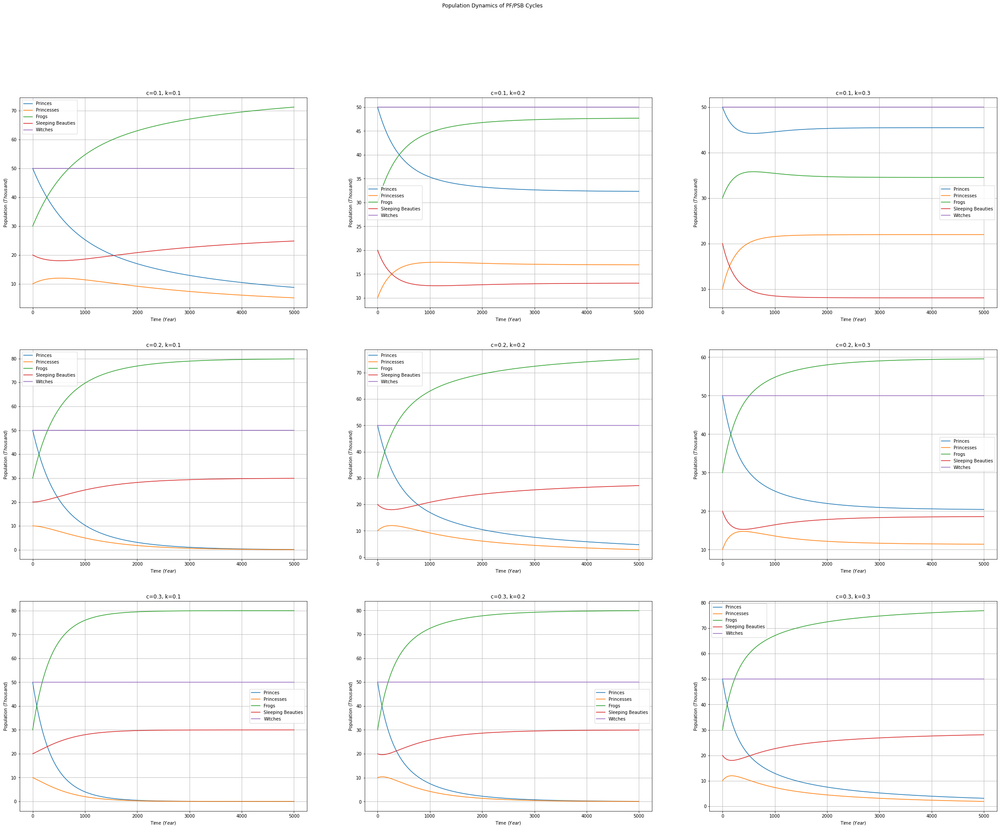

In [ ]:
# Define the initial conditions
y0 = [50, 10, 30, 20, 50]

call_model(y0)

# Show the plots
plt.show()

AGENT-BASED MODEL FOR THE ENCHANTED KINGDOM

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Define model parameters
grid_size = 50
C_f = 0.05  # Probability of a prince/princess being cursed by a witch
K_f = 0.2   # Probability of a prince/frog being kissed by a princess
n_steps = 1000  # Number of simulation steps

# Define the agents
class Agent:
    def __init__(self, x, y, agent_type):
        self.x = x
        self.y = y
        self.type = agent_type
    
    def move(self):
      if(self.type == 'sleeping beauty'):
        return
      # Move the agent one step in a random direction
      dx, dy = random.choice([(1, 0), (-1, 0), (0, 1), (0, -1)])
      self.x = (self.x + dx) % grid_size
      self.y = (self.y + dy) % grid_size
  
    def interact(self, other_agents):
        # Find neighboring agents
        neighbors = [agent for agent in other_agents if (abs(agent.x - self.x) <= 1 and abs(agent.y - self.y) <= 1)]
        
        if self.type == 'witch':
            # Cursing a nearby prince/princess
            for agent in neighbors:
                if agent.type == 'prince':
                    if random.random() < C_f:
                        agent.type = 'frog'
                if agent.type == 'princess':
                    if random.random() < C_f:
                        agent.type = 'sleeping beauty'
        
        # elif self.type == 'prince':
        #     # Kissing a nearby princess
        #     for agent in neighbors:
        #         if agent.type == 'princess':
        #             if random.random() < K_f:
        #                 agent.type = 'prince'
        
        elif self.type == 'frog':
            # Turning back into a prince
            for agent in neighbors:
                if agent.type == 'princess':
                    if random.random() < K_f:
                        self.type = 'prince'
        elif self.type == 'sleeping beauty':
            # Turning back into a prince
            for agent in neighbors:
                if agent.type == 'prince':
                    if random.random() < K_f:
                        self.type = 'princess'

6 30 30 20 20


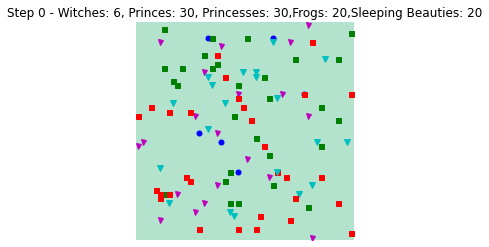

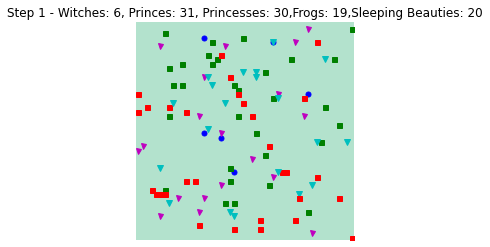

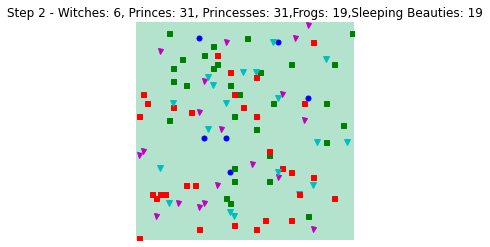

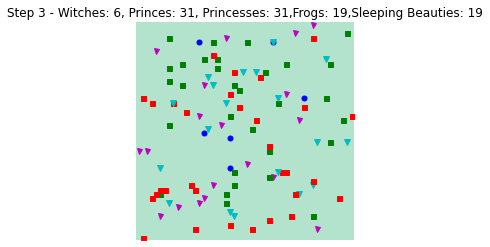

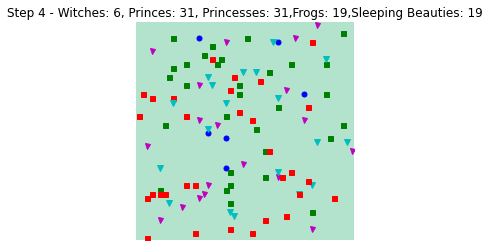

...

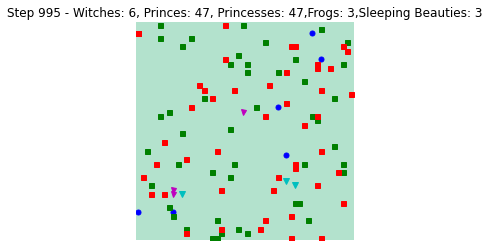

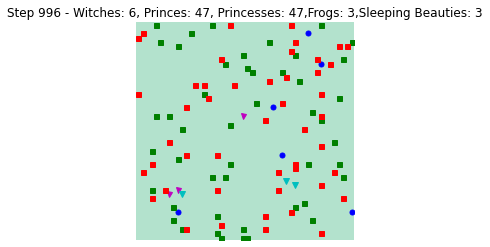

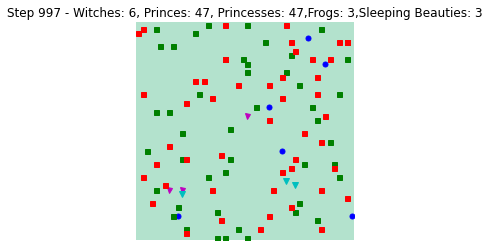

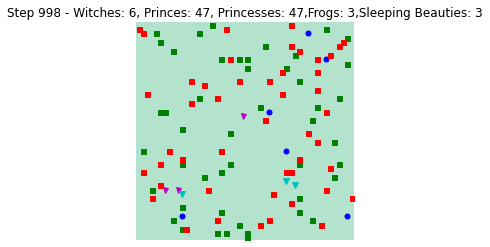

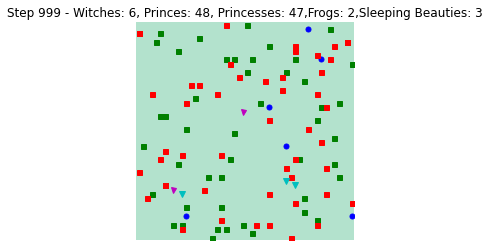

In [ ]:
# Initialize the agents
agents = [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), 'witch') for i in range(6)]
agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['prince','frog'])) for i in range(50)]
agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['princess','sleeping beauty'])) for i in range(50)]

# n_witches_list = []
# n_princes_list = []
# n_princesses_list = []

n_witches = sum([agent.type == 'witch' for agent in agents])
n_princes = sum([agent.type == 'prince' for agent in agents])
n_princesses = sum([agent.type == 'princess' for agent in agents])
n_frogs = sum([agent.type == 'frog' for agent in agents])
n_sleeping_beauties = sum([agent.type == 'sleeping beauty' for agent in agents])

print(n_witches,n_princes,n_princesses,n_frogs,n_sleeping_beauties)

# Define the simulation function
def simulate(step):
    # Move the agents
    for agent in agents:
        agent.move()
    
    # Interact the agents
    for agent in agents:
        agent.interact(agents)
    
    # Count the number of agents of each type
    n_witches = sum([agent.type == 'witch' for agent in agents])
    n_princes = sum([agent.type == 'prince' for agent in agents])
    n_princesses = sum([agent.type == 'princess' for agent in agents])
    n_frogs = sum([agent.type == 'frog' for agent in agents])
    n_sleeping_beauties = sum([agent.type == 'sleeping beauty' for agent in agents])

    # n_witches_list.append(n_witches)
    # n_princes_list.append(n_princes)
    # n_princesses_list.append(n_princesses)

    
    # Update the plot
    plt.clf()
    plt.imshow(np.zeros((grid_size, grid_size)), cmap='Pastel2')
    for agent in agents:
        if agent.type == 'witch':
            plt.plot(agent.x, agent.y, 'bo', markersize=5)
        elif agent.type == 'prince':
            plt.plot(agent.x, agent.y, 'gs', markersize=5)
        elif agent.type == 'princess':
            plt.plot(agent.x, agent.y, 'rs', markersize=5)
        elif agent.type == 'frog':
            plt.plot(agent.x, agent.y, 'vm', markersize=5)
        elif agent.type == 'sleeping beauty':
            plt.plot(agent.x, agent.y, 'cv', markersize=6)
    plt.title(f'Step {step} - Witches: {n_witches}, Princes: {n_princes}, Princesses: {n_princesses},Frogs: {n_frogs},Sleeping Beauties: {n_sleeping_beauties}')
    plt.axis('off')

    # Plot the populations over time
    # plt.figure()
    # plt.plot(np.arange(len(n_witches_list)), n_witches_list, label='Witches')
    # plt.plot(np.arange(len(n_princes_list)), n_princes_list, label='Princes')
    # plt.plot(np.arange(len(n_princesses_list)), n_princesses_list, label='Princesses')
    # plt.xlabel('Time step ($Year$)')
    # plt.ylabel('Population ($Thousand$)')
    # plt.legend()
    # plt.grid()
    plt.show()


# # Run the simulation
# n_witches_list = []
# n_princes_list = []
# n_princesses_list = []

# # Initialize the agents
# agents = [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), 'witch') for i in range(50)]
# agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['prince','frog'])) for i in range(50)]
# agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['princess','sleeping beauty'])) for i in range(50)]


for step in range(n_steps):
  simulate(step)


# Simulation for varying c and k factors for ABM

In [ ]:
# Define the simulation function
def simulate(step):
    # Move the agents
    for agent in agents:
        agent.move()
    
    # Interact the agents
    for agent in agents:
        agent.interact(agents)
    
    # Count the number of agents of each type
    n_witches = sum([agent.type == 'witch' for agent in agents])
    n_princes = sum([agent.type == 'prince' for agent in agents])
    n_princesses = sum([agent.type == 'princess' for agent in agents])
    n_frog = sum([agent.type == 'frog' for agent in agents])
    n_sleeping_beauties = sum([agent.type == 'sleeping beauty' for agent in agents])
    # n_princesses = sum([agent.type == 'princess' for agent in agents])
    n_witches_list.append(n_witches)
    n_princes_list.append(n_princes)
    n_princesses_list.append(n_princesses)
    n_frog_list.append(n_frog)
    n_sleeping_beauties_list.append(n_sleeping_beauties)
    
    return (np.arange(len(n_witches_list)), [n_witches_list,n_princes_list,n_princesses_list,n_frog_list,n_sleeping_beauties_list])

ABM Version 1: witches = 6

In [ ]:
# Define the constants to vary
c_values = [0.1, 0.2, 0.3]
k_values = [0.1, 0.2, 0.3]
n_steps = 5001  # Number of simulation steps

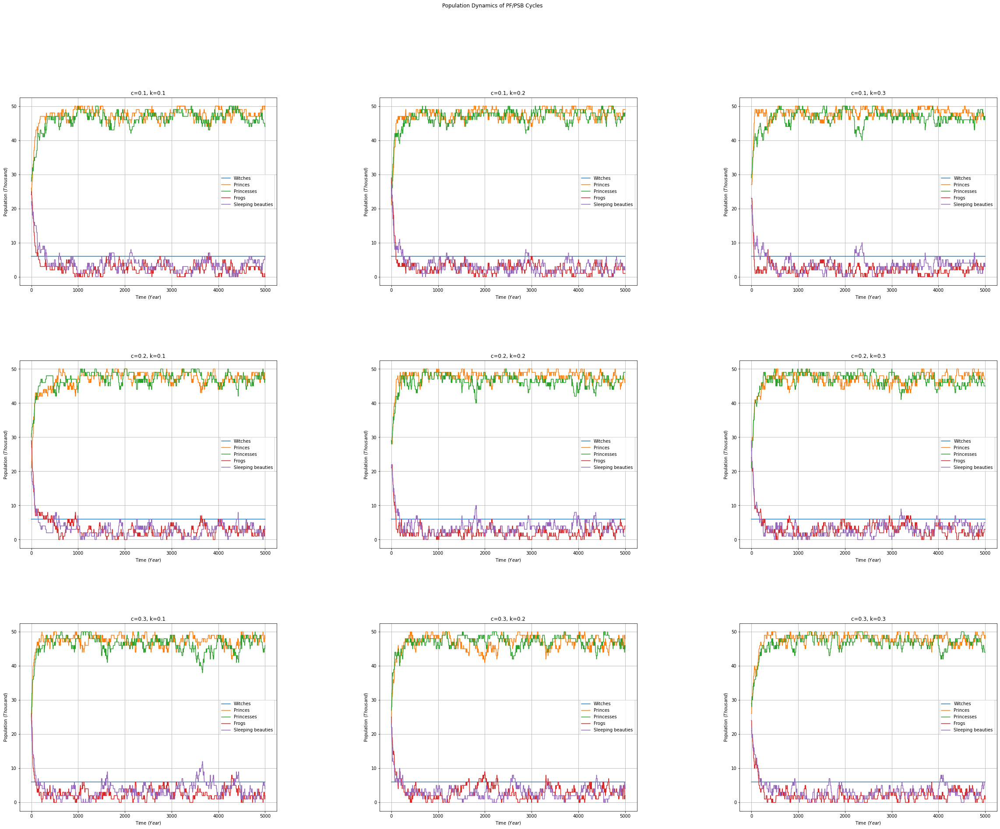

In [ ]:
# Define the constants to vary
c_values = [0.1, 0.2, 0.3]
k_values = [0.1, 0.2, 0.3]
n_steps = 5001  # Number of simulation steps
# Define figure size and layout
fig, axs = plt.subplots(len(k_values),len(c_values), figsize=(40, 30))

# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
      # Initialize the agents
      agents = [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), 'witch') for i in range(6)]
      agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['prince','frog'])) for i in range(50)]
      agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['princess','sleeping beauty'])) for i in range(50)]

      n_witches_list = []
      n_princes_list = []
      n_princesses_list = []
      n_frog_list = []
      n_sleeping_beauties_list = []

      # Solve the system of differential equations with the current set of constants
      for step in range(n_steps):
        t, y = simulate(step)
      # print(i,j)
      # Plot the results
      ax = axs[i, j]
      ax.plot(t, y[0], label='Witches')
      ax.plot(t, y[1], label='Princes')
      ax.plot(t, y[2], label='Princesses')
      ax.plot(t, y[3], label='Frogs')
      ax.plot(t, y[4], label='Sleeping beauties')
      ax.set_title(f'c={c}, k={k}')
      ax.set_xlabel('Time ($Year$)')
      ax.set_ylabel('Population ($Thousand$)')
      ax.legend()

      # Add grid
      ax.grid(True)

# Add overall figure title
fig.suptitle('Population Dynamics of PF/PSB Cycles')

# Adjust space between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Show the plots
plt.show()

ABM Version 1: witches = 50

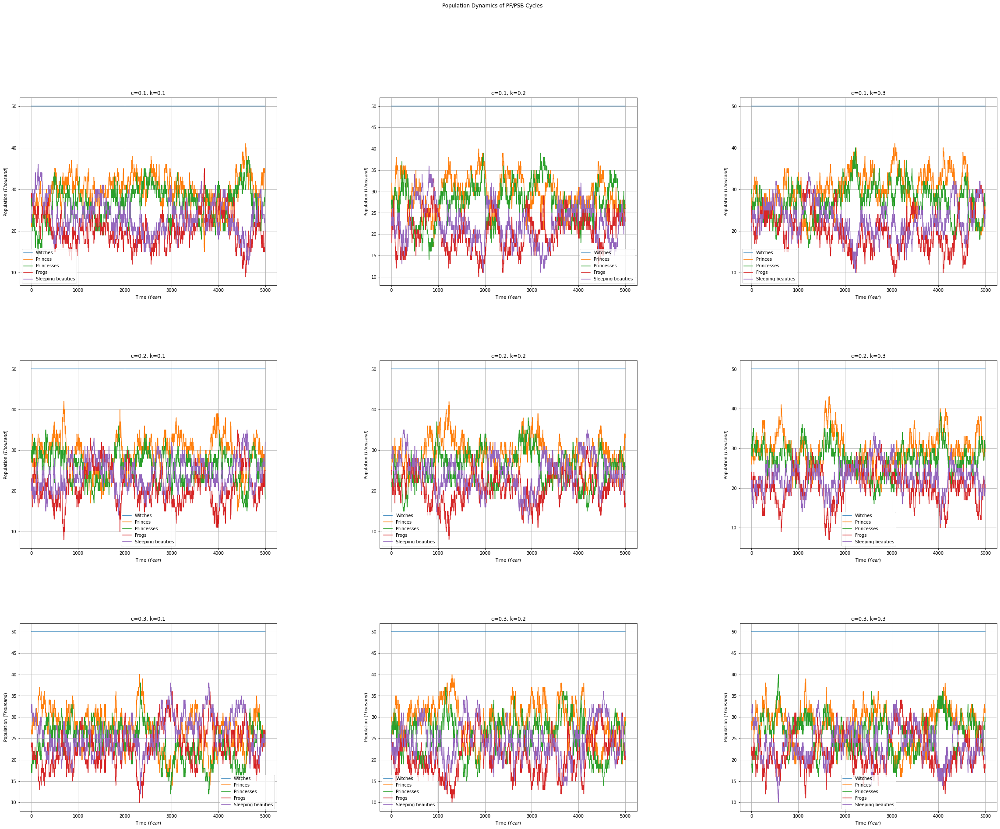

In [ ]:
# Define figure size and layout
fig, axs = plt.subplots(len(k_values),len(c_values), figsize=(40, 30))

# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
      # Initialize the agents
      agents = [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), 'witch') for i in range(50)]
      agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['prince','frog'])) for i in range(50)]
      agents += [Agent(np.random.randint(0, grid_size), np.random.randint(0, grid_size), np.random.choice(['princess','sleeping beauty'])) for i in range(50)]

      n_witches_list = []
      n_princes_list = []
      n_princesses_list = []
      n_frog_list = []
      n_sleeping_beauties_list = []

      # Solve the system of differential equations with the current set of constants
      for step in range(n_steps):
        t, y = simulate(step)
      # print(i,j)
      # Plot the results
      ax = axs[i, j]
      ax.plot(t, y[0], label='Witches')
      ax.plot(t, y[1], label='Princes')
      ax.plot(t, y[2], label='Princesses')
      ax.plot(t, y[3], label='Frogs')
      ax.plot(t, y[4], label='Sleeping beauties')
      ax.set_title(f'c={c}, k={k}')
      ax.set_xlabel('Time ($Year$)')
      ax.set_ylabel('Population ($Thousand$)')
      ax.legend()

      # Add grid
      ax.grid(True)

# Add overall figure title
fig.suptitle('Population Dynamics of PF/PSB Cycles')

# Adjust space between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Show the plots
plt.show()

## Equilibrium Analysis for W=1

In [ ]:
from pprint import pprint
def equi_stable(c,k, P,Q, F, S, W):
    eq=(k*F*Q/c*W, k*S*P/c*W, c*W*P/k*Q, W)
    print("Equilibrium points....\n")
    pprint(eq)
    J =np.array([[-c*W, k*F, k*Q, 0, 0], [k*S, -c*W, 0, k*P, 0],[c*W, -k*F, -k*Q, 0, 0],
                [-k*S, c*W, 0, -k*P, 0], [0, 0, 0, 0, 0]])
    print("The corresponding Jacobian..\n")
    pprint(J)
    eigen_val, _ =np.linalg.eig(J)
    print("The eigen values..\n")
    pprint(eigen_val)
    return eq, eigen_val

In [ ]:
y0 = [50, 10, 30, 20, 6]

# Define the time points
t = np.linspace(0, 0.1, 5001)

# # Define the time points
# t = np.linspace(0, 5000, 101)

# Define the constants to vary
c_values = [0.1, 0.2, 0.3, 0.4, 0.9]
k_values = [0.1, 0.2, 0.3, 0.4, 0.5]

y = odeint(model, y0, t, args=(c, c, k))
# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
        # Solve the system of differential equations with the current set of constants
        y = odeint(model, y0, t, args=(c, c, k))
        
        P,Q, F, S, W =y[:, 0][-1], y[:, 1][-1], y[:, 2][-1], y[:, 3][-1], 1.0
        print("=======================================================================")
        print("Stability analysis for Different Choice of c={} and k={}".format(c, k))
        print("=======================================================================")
        eq, eigen =equi_stable(c,k, P,Q, F, S, W)

Stability analysis for Different Choice of c=0.1 and k=0.1
Equilibrium points....

(498.4161132199865, 651.7281431735495, 881.2539082487676, 1.0)
The corresponding Jacobian..

array([[-0.1       ,  2.89005983,  1.72458753,  0.        ,  0.        ],
       [ 1.27541247, -0.1       ,  0.        ,  5.10994017,  0.        ],
       [ 0.1       , -2.89005983, -1.72458753,  0.        ,  0.        ],
       [-1.27541247,  0.1       ,  0.        , -5.10994017,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ]])
The eigen values..

array([-6.07678949e+00+0.00000000e+00j, -9.57738212e-01+0.00000000e+00j,
       -3.99324271e-17+7.11852717e-16j, -3.99324271e-17-7.11852717e-16j,
        0.00000000e+00+0.00000000e+00j])
Stability analysis for Different Choice of c=0.1 and k=0.2
Equilibrium points....

(1069.3235245609794, 856.9391286863021, 627.1078194395146, 1.0)
The corresponding Jacobian..

array([[ -0.1       ,   4.78209865,   4.4721935 ,   0.        ,
     

## Equilibrium Analysis for W=6

In [ ]:
y0 = [50, 10, 30, 20, 6]

# Define the time points
t = np.linspace(0, 0.1, 5001)

# # Define the time points
# t = np.linspace(0, 5000, 101)

# Define the constants to vary
c_values = [0.1, 0.2, 0.3, 0.4, 0.9]
k_values = [0.1, 0.2, 0.3, 0.4, 0.5]

y = odeint(model, y0, t, args=(c, c, k))
# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
        # Solve the system of differential equations with the current set of constants
        y = odeint(model, y0, t, args=(c, c, k))
        
        P,Q, F, S, W =y[:, 0][-1], y[:, 1][-1], y[:, 2][-1], y[:, 3][-1], y[:, 4][-1]
        print("=======================================================================")
        print("Stability analysis for Different Choice of c={} and k={}".format(c, k))
        print("=======================================================================")
        eq, eigen =equi_stable(c,k, P,Q, F, S, W)

Stability analysis for Different Choice of c=0.1 and k=0.1
Equilibrium points....

(2990.496679319919, 3910.3688590412967, 5287.523449492606, 6.0)
The corresponding Jacobian..

array([[-0.6       ,  2.89005983,  1.72458753,  0.        ,  0.        ],
       [ 1.27541247, -0.6       ,  0.        ,  5.10994017,  0.        ],
       [ 0.6       , -2.89005983, -1.72458753,  0.        ,  0.        ],
       [-1.27541247,  0.6       ,  0.        , -5.10994017,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ]])
The eigen values..

array([-6.57678949e+00, -1.45773821e+00,  9.62036256e-16, -2.42369241e-16,
        0.00000000e+00])
Stability analysis for Different Choice of c=0.1 and k=0.2
Equilibrium points....

(6415.9411473658765, 5141.634772117813, 3762.646916637087, 6.0)
The corresponding Jacobian..

array([[ -0.6       ,   4.78209865,   4.4721935 ,   0.        ,
          0.        ],
       [  1.5278065 ,  -0.6       ,   0.        ,  11.21790135,
    

In [ ]:
from pprint import pprint
def equi_stable(c,k, P,Q, F, S, W):
    eq=(k*F*Q/c*W, k*S*P/c*W, c*W*P/k*Q, W)
    print("Equilibrium points....\n")
    pprint(eq)
    J =np.array([[-c*W, k*F, k*Q, 0, 0], [k*S, -c*W, 0, k*P, 0],[c*W, -k*F, -k*Q, 0, 0],
                [-k*S, c*W, 0, -k*P, 0], [0, 0, 0, 0, 0]])
    print("The corresponding Jacobian..\n")
    pprint(J)
    eigen_val, _ =np.linalg.eig(J)
    print("The eigen values..\n")
    pprint(eigen_val)
    return eq, eigen_val

## Equilibrium Analysis for W=1

In [ ]:
y0 = [50, 10, 30, 20, 6]

# Define the time points
t = np.linspace(0, 0.1, 5001)

# # Define the time points
# t = np.linspace(0, 5000, 101)

# Define the constants to vary
c_values = [0.1, 0.2, 0.3, 0.4, 0.9]
k_values = [0.1, 0.2, 0.3, 0.4, 0.5]

y = odeint(model, y0, t, args=(c, c, k))
# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
        # Solve the system of differential equations with the current set of constants
        y = odeint(model, y0, t, args=(c, c, k))
        
        P,Q, F, S, W =y[:, 0][-1], y[:, 1][-1], y[:, 2][-1], y[:, 3][-1], 1.0
        print("=======================================================================")
        print("Stability analysis for Different Choice of c={} and k={}".format(c, k))
        print("=======================================================================")
        eq, eigen =equi_stable(c,k, P,Q, F, S, W)

Stability analysis for Different Choice of c=0.1 and k=0.1
Equilibrium points....

(498.4161132199865, 651.7281431735495, 881.2539082487676, 1.0)
The corresponding Jacobian..

array([[-0.1       ,  2.89005983,  1.72458753,  0.        ,  0.        ],
       [ 1.27541247, -0.1       ,  0.        ,  5.10994017,  0.        ],
       [ 0.1       , -2.89005983, -1.72458753,  0.        ,  0.        ],
       [-1.27541247,  0.1       ,  0.        , -5.10994017,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ]])
The eigen values..

array([-6.07678949e+00+0.00000000e+00j, -9.57738212e-01+0.00000000e+00j,
       -3.99324271e-17+7.11852717e-16j, -3.99324271e-17-7.11852717e-16j,
        0.00000000e+00+0.00000000e+00j])
Stability analysis for Different Choice of c=0.1 and k=0.2
Equilibrium points....

(1069.3235245609794, 856.9391286863021, 627.1078194395146, 1.0)
The corresponding Jacobian..

array([[ -0.1       ,   4.78209865,   4.4721935 ,   0.        ,
     

## Equilibrium Analysis for W=6

In [ ]:
y0 = [50, 10, 30, 20, 6]

# Define the time points
t = np.linspace(0, 0.1, 5001)

# # Define the time points
# t = np.linspace(0, 5000, 101)

# Define the constants to vary
c_values = [0.1, 0.2, 0.3, 0.4, 0.9]
k_values = [0.1, 0.2, 0.3, 0.4, 0.5]

y = odeint(model, y0, t, args=(c, c, k))
# Loop through each set of constants and plot the results
for i, c in enumerate(c_values):
    for j, k in enumerate(k_values):
        # Solve the system of differential equations with the current set of constants
        y = odeint(model, y0, t, args=(c, c, k))
        
        P,Q, F, S, W =y[:, 0][-1], y[:, 1][-1], y[:, 2][-1], y[:, 3][-1], y[:, 4][-1]
        print("=======================================================================")
        print("Stability analysis for Different Choice of c={} and k={}".format(c, k))
        print("=======================================================================")
        eq, eigen =equi_stable(c,k, P,Q, F, S, W)

Stability analysis for Different Choice of c=0.1 and k=0.1
Equilibrium points....

(2990.496679319919, 3910.3688590412967, 5287.523449492606, 6.0)
The corresponding Jacobian..

array([[-0.6       ,  2.89005983,  1.72458753,  0.        ,  0.        ],
       [ 1.27541247, -0.6       ,  0.        ,  5.10994017,  0.        ],
       [ 0.6       , -2.89005983, -1.72458753,  0.        ,  0.        ],
       [-1.27541247,  0.6       ,  0.        , -5.10994017,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ]])
The eigen values..

array([-6.57678949e+00, -1.45773821e+00,  9.62036256e-16, -2.42369241e-16,
        0.00000000e+00])
Stability analysis for Different Choice of c=0.1 and k=0.2
Equilibrium points....

(6415.9411473658765, 5141.634772117813, 3762.646916637087, 6.0)
The corresponding Jacobian..

array([[ -0.6       ,   4.78209865,   4.4721935 ,   0.        ,
          0.        ],
       [  1.5278065 ,  -0.6       ,   0.        ,  11.21790135,
    

# END